<a href="https://colab.research.google.com/github/davidmacer/clase-percepcion-remota/blob/main/lab_002_filtros_indices.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
# Commented out IPython magic to ensure Python compatibility.
from skimage import color
from skimage import data
import numpy as np
import scipy
from skimage import data, io
from skimage import data, io, filters
# %matplotlib inline
import warnings
import skimage as sk
from matplotlib import pyplot as plt
warnings.filterwarnings("ignore")

"""## Bajando datos"""

!pip install geopandas

import pandas as pd
import geopandas as gpd
import folium
import os, shutil
from glob import glob

!pip install sentinelsat

from sentinelsat import SentinelAPI

In [2]:
# Credenciales para usar la api del scihub de copernicus

user = 'davidmacer'
password = 'Lu4iJd0BAk48'
api = SentinelAPI(user, password, 'https://scihub.copernicus.eu/dhus')

In [7]:
import geopandas as gpd
import folium

In [8]:
ruta_datos = "/content/drive/MyDrive/MCIG/cuatrimestre_02/PR/practicas/Material-PR-2021/Laboratorios/"

ciencds = gpd.read_file(ruta_datos + "silhueta_100_ciudades.shp")

m = folium.Map(location= [25.5665, -108.4660], zoom_start=10)
folium.GeoJson(ciencds).add_to(m)
m

In [5]:
footprint = 'POLYGON((-108.8029 25.3350, -108.7632 25.3350, -108.4799 25.3350, -108.4595 25.3120, -108.8029 25.3350))'
products = api.query(footprint,
                  date = ('20200101', '20210101'),
                  platformname = 'Sentinel-2',
                  processinglevel = 'Level-2A',
                  cloudcoverpercentage = (0,10)
                  )

In [6]:
products_gdf = api.to_geodataframe(products)
products_gdf_sorted = products_gdf.sort_values(['cloudcoverpercentage'], ascending=[True])
products_gdf_sorted.head()

products_gdf_sorted.index[0]

'55d2479c-a22b-481f-87ea-31936c5290d6'

In [7]:
api.download(products_gdf_sorted.index[0])

Downloading: 100%|██████████| 1.12G/1.12G [01:24<00:00, 13.2MB/s]
MD5 checksumming: 100%|██████████| 1.12G/1.12G [00:02<00:00, 414MB/s]


{'Creation Date': datetime.datetime(2020, 12, 14, 22, 58, 10, 335000),
 'Ingestion Date': datetime.datetime(2020, 12, 14, 22, 57, 17, 968000),
 'Online': True,
 'date': datetime.datetime(2020, 12, 14, 17, 47, 29, 24000),
 'downloaded_bytes': 1115202860,
 'footprint': 'POLYGON((-109.00157 26.033984519463594,-108.97821 26.13040235125954,-108.96005 26.205314883327617,-107.90082 26.186525525260194,-107.92636 25.196449361019003,-109.01521 25.215084834768362,-109.00157 26.033984519463594))',
 'id': '55d2479c-a22b-481f-87ea-31936c5290d6',
 'md5': '93071B6697392FB494F306DBCDBF49AF',
 'path': './S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.zip',
 'size': 1115202860,
 'title': 'S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835',
 'url': "https://scihub.copernicus.eu/dhus/odata/v1/Products('55d2479c-a22b-481f-87ea-31936c5290d6')/$value"}

In [8]:
#
import zipfile
with zipfile.ZipFile("/content/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.zip", 'r') as value:
  value.extractall("S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835")


In [9]:
!pip install rasterio

import rasterio as rio

     |████████████████████████████████| 19.1MB 32.4MB/s 


In [10]:
# Open Bands 4, 3 and 2 with Rasterio
#Ruta = 'content/S2A_MSIL1C_20150829T085006_N0204_R107_T35SMS_20150829T090010/S2A_MSIL1C_20150829T085006_N0204_R107_T35SMS_20150829T090010.SAFE/GRANULE/L1C_T35SMS_A000962_20150829T090010/IMG_DATA/'

b2 = rio.open('/content/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.SAFE/GRANULE/L2A_T12RYP_A019715_20201214T174731/IMG_DATA/R10m/T12RYP_20201214T174729_B02_10m.jp2')
#/content/S2A_MSIL1C_20150829T085006_N0204_R107_T35SMS_20150829T090010/S2A_MSIL1C_20150829T085006_N0204_R107_T35SMS_20150829T090010.SAFE/GRANULE/L1C_T35SMS_A000962_20150829T090010/IMG_DATA/T35SMS_20150829T085006_B04.jp2')
b3 = rio.open('/content/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.SAFE/GRANULE/L2A_T12RYP_A019715_20201214T174731/IMG_DATA/R10m/T12RYP_20201214T174729_B03_10m.jp2')
b4 = rio.open('/content/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.SAFE/GRANULE/L2A_T12RYP_A019715_20201214T174731/IMG_DATA/R10m/T12RYP_20201214T174729_B04_10m.jp2')


In [11]:
# Create an RGB image
with rio.open('RGB.tiff','w',driver='Gtiff', width=b4.width, height=b4.height,
              count=3,crs=b4.crs,transform=b4.transform, dtype=b4.dtypes[0]) as rgb:
    rgb.write(b2.read(1),1)
    rgb.write(b3.read(1),2)
    rgb.write(b4.read(1),3)
    rgb.close()

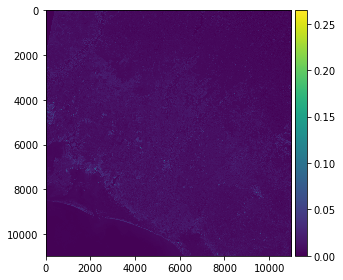

In [12]:
imagen_original= sk.io.imread("RGB.tiff")

img_gray = sk.color.rgb2gray(imagen_original)

sk.io.imshow(img_gray)

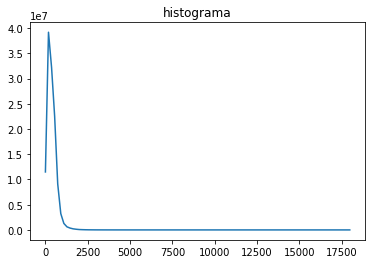

In [13]:
#Histograma de cada banda de la imagen.
histograma_r = np.histogram(imagen_original[:,:,0], bins=100)
histograma_g = np.histogram(imagen_original[:,:,1], bins=20)
histograma_b = np.histogram(imagen_original[:,:,2], bins=30 )

from matplotlib import pyplot as plt 
plt.plot(histograma_r[1][:-1],histograma_r[0] )
plt.title("histograma") 
plt.show()


In [14]:
# Especificación del histograma
import matplotlib.pyplot as plt

from skimage import data
from skimage import exposure
from skimage.exposure import match_histograms

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


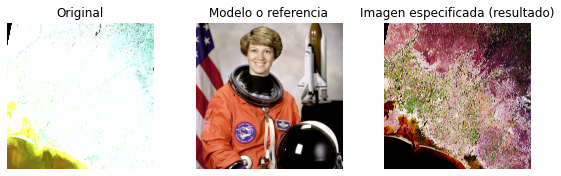

In [15]:
#Sacamos la media del histograma
np.mean(histograma_b[1])

#Sacamos la desviación del histograma
np.std(histograma_b[1])

modelo = data.astronaut()
i = imagen_original

salida = match_histograms(i, modelo, multichannel=True)

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))
for aa in (ax1, ax2, ax3):
    aa.set_axis_off()

ax1.imshow(i)
ax1.set_title('Original')
ax2.imshow(modelo)
ax2.set_title('Modelo o referencia')
ax3.imshow(salida)
ax3.set_title('Imagen especificada (resultado)')

plt.tight_layout()
plt.show()

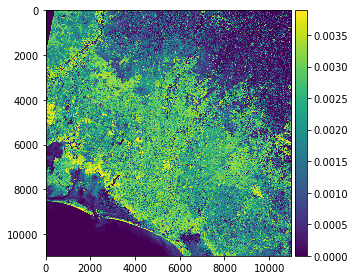

In [16]:
img_gray = sk.color.rgb2gray(salida)

sk.io.imshow(img_gray)

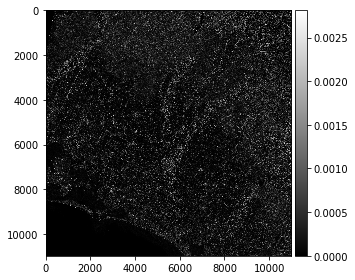

In [17]:
#Diferentes filtros.

Prewitt = filters.prewitt(img_gray)
io.imshow(Prewitt, cmap='gray')
io.show()

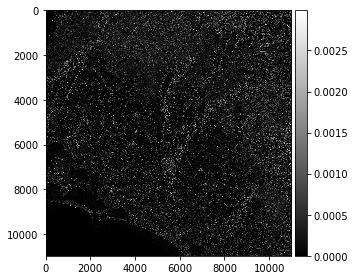

In [18]:
Sobel = filters.sobel(img_gray)
io.imshow(Sobel, cmap='gray')
io.show()

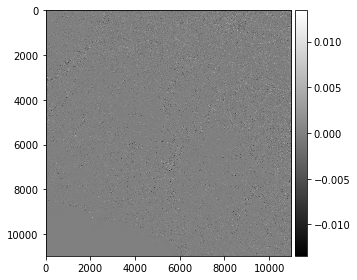

In [19]:
laplace = filters.laplace(img_gray)
io.imshow(laplace, cmap='gray')
io.show()

In [20]:
import cv2
import numpy as np

In [21]:
#im = cv2.imread("RGB.tif", cv2.IMREAD_GRAYSCALE)
#a = [ [ -1.0, 0.0, 1. ],
#      [ -1.0, 0.0, 1.0 ],
#      [ -1.0, 0.0, 1.0 ] ]

#kernel = np.asarray(a)
#img_cv = cv2.filter2D(img_gray, -1,kernel) #-1 indica la profundidad de color de la imagen de salida
#print(img_cv.min(), img_cv.max())

#a


IndentationError: ignored

In [ ]:
#from IPython.display import Image
#Image(filename = 'RGB.tif')

#norm = cv2.normalize(img_cv, None, 0, 255, cv2.NORM_MINMAX)
#print(norm.min(), norm.max())

#cv2.imwrite("convolucion.png", norm)
#Image(filename="convolucion.png")

### Cálculo de índices espectrales

In [9]:
import rasterio
import rasterio.plot
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# Import the "gdal" and "gdal_array" submodules from within the "osgeo" module
from osgeo import gdal
from osgeo import gdal_array

# Import the NumPy module
import numpy as np
import glob

In [10]:
red_file = glob.glob("/content/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.SAFE/GRANULE/L2A_T12RYP_A019715_20201214T174731/IMG_DATA/R10m/T12RYP_20201214T174729_B04_10m.jp2")
nir_file = glob.glob("/content/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.SAFE/GRANULE/L2A_T12RYP_A019715_20201214T174731/IMG_DATA/R10m/T12RYP_20201214T174729_B08_10m.jp2") 
green_file = glob.glob("/content/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835/S2B_MSIL2A_20201214T174729_N0214_R098_T12RYP_20201214T201835.SAFE/GRANULE/L2A_T12RYP_A019715_20201214T174731/IMG_DATA/R10m/T12RYP_20201214T174729_B03_10m.jp2") 

In [11]:
red_link = gdal.Open(red_file[0])
nir_link = gdal.Open(nir_file[0])
green_link = gdal.Open(green_file[0])

In [12]:
# convertimos a flotantes
red = red_link.ReadAsArray().astype(np.float)
nir = nir_link.ReadAsArray().astype(np.float)
green = green_link.ReadAsArray().astype(np.float)

AttributeError: ignored

In [13]:
#Funcion que calcula el ndvi
def get_ndvi(red, nir):
 return ((nir - red)/(nir + red))

In [14]:
# calculamos el ndvi
ndvi2 = get_ndvi(red, nir)

# creamos la variable del archivo de salida
#outfile_name = red_file[0].split('_B')[0] + '_NDVI.tif'
 
#x_pixels = ndvi2.shape[0] 
#y_pixels = ndvi2.shape[1] 
 
#  GeoTIFF
#driver = gdal.GetDriverByName('GTiff')
 
# creamos donde se guardará la imagen
#ndvi_data = driver.Create(outfile_name,x_pixels, y_pixels, 1,gdal.GDT_Float32)
 
#  NDVI array en la primera banda
#ndvi_data.GetRasterBand(1).WriteArray(ndvi2)

plt.imshow(ndvi2)


NameError: ignored

## Ejercicio
- Aplicar los filtros con las imagenes de satélite, image[:, :, 1] (por ejemplo), ya que los filtros tipicamente se aplican en imágenes en escala de grises, es decir, una sola banda.
Aplicar los tradicionales, modificar la variable del kernel, en su tamaño y valores, y observar las imágenes de resultado.

- Calcular y visualizar histogramas de las imágenes resultado de los índices espectrales calculados.

- Cargar una imagen tif con las bandas calcular algunos de los indices espectrales vistos en clase.  Utilizar el código que vimos en la practica 1 para las imágenes TIF.

- Visualizar los resultados y anotar observaciones o algunos aspectos que consideren relevantes.


In [ ]:
#Funcion que calcula el gndvi
def get_gndvi(green, nir):
 return ((nir - green)/(nir + green))

def get_rvi(nir, red):
  return (nir / red)

def get_gvi(nir, green):
  return (nir / green)

In [ ]:
gndvi = get_gndvi(green, nir)

plt.imshow(gndvi)

In [ ]:
rvi = get_rvi(nir, red)

plt.imshow(rvi)

In [ ]:
gvi = get_gvi(nir, green)

plt.imshow(gvi)